<a href="https://colab.research.google.com/github/amir-asari/SEBB4083-Assignment2024/blob/main/SEBB4083_G4_Mini_Project_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mini Project 2024 (Groceries Detection)
### Total marks: 30

### Group No.: 4

###Group Members:
1) ALEEYAH NUR SABRINA BINTI DZUREN (A20EB0004)

2) ANIS SOFEA BINTI ROS ZULKEFLEE (A20EB0007)

3) CHAI YI WEI (A20EB0011)

4) JAMIL ALVIR (A20EB0099)

5) NUR SYAIDA IZZATI BINTI MAHAT ( A20EB0054)

## Chapter 1: Introduction


###1.1 Background of study and related works

It is estimated that millions of individuals across the world suffer from visual impairment, which significantly affects their quality of life and poses challenges in a variety of daily activities, including grocery shopping. Navigating supermarket aisles and recognizing specific products in supermarkets can be particularly challenging tasks for them. Using artificial intelligence, particularly in computer vision, can alleviate these difficulties, increasing the quality of life for visually impaired individuals [1]. By providing accurate product identification, automated grocery detection systems can enhance the shopping experience for visually impaired individuals, allowing them to navigate supermarkets and identify products better [1]. In this project, we will develop such a system focusing on two specific grocery items: vinegar and tomato sauce.

It has been found in the last few years that Convolutional Neural Networks (CNNs) have made significant progress in the field of image classification and object detection [2]. Using the Transfer Learning approach, it can be achieved to fine-tune a pre-trained model on a new task, thereby leveraging existing knowledge while taking advantage of previously learned patterns [3]. In image recognition tasks, the VGG16 model has been extensively used because of its superior performance. Studies published in the past have shown that transfer learning can be used to perform a variety of classification tasks, such as identifying fruit [4], recognising products [5], and detecting plant diseases [6]. Based on these studies, CNNs and transfer learning can be used to develop accurate and reliable classification systems.  

###1.2 Objectives



1.   To collect and create diverse data set for vinegar and tomato sauce.
2.   To develop automated classisfication algorithm in order to distinguish between vinegar and tomato sauce.



## Chapter 2: Methodology and Results

# Methodology

Step 1: Setup

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile36
from zipfile36 import ZipFile

Step 2: Data preprocessing

Download data from google drive

In [ ]:
! gdown 1O5fRWLN0PdkHGoA2BWmmVU_FhN01fkhi


Downloading...
From: https://drive.google.com/uc?id=1O5fRWLN0PdkHGoA2BWmmVU_FhN01fkhi
To: /content/Resized Dataset.zip
100% 17.4M/17.4M [00:01<00:00, 12.5MB/s]


Unzip downloaded file

In [ ]:
with ZipFile('/content/Resized Dataset.zip','r') as zipObj:
  zipObj.extractall()

*Load data using Keras utility*

Next, load these images off disk using the helpful tf.keras.utils.image_dataset_from_directory utility. This will take you from a directory of images on disk to a tf.data. Dataset in just a couple lines of code.

Step 3: Create a dataset

Define some parameters for the ImageDataGenerator:

In [ ]:
batch_size = 50 # Of course here, we are using mini-batch gradient descent; by default =32
img_height = 224 #VGG16 image size should be 224 X 224 X 3
img_width = 224

Step 4: Data splitting

Split the data into 70% training data and 30% testing data. Once splitted, all data will saved in folder called training_data and testing_data

In [ ]:
# path to  dataset directory
dataset_dir = '/content/Resized_Image'

# Path to the directory in the train and test folders
output_dir = '/content/output'

test_split = 0.3

#list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

#train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')


if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Creating train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Creating subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['Vinegar', 'Tomato Sauce']
/content/Resized_Image/Vinegar/20240524_161342.jpg
/content/output/train/Vinegar/20240524_161342.jpg
/content/Resized_Image/Vinegar/IMG_5259.jpg
/content/output/train/Vinegar/IMG_5259.jpg
/content/Resized_Image/Vinegar/20240524_161125.jpg
/content/output/train/Vinegar/20240524_161125.jpg
/content/Resized_Image/Vinegar/IMG_20240523_194258_Burst07.jpg
/content/output/train/Vinegar/IMG_20240523_194258_Burst07.jpg
/content/Resized_Image/Vinegar/IMG_20240523_194218_Burst01.jpg
/content/output/train/Vinegar/IMG_20240523_194218_Burst01.jpg
/content/Resized_Image/Vinegar/IMG_5229 (1).jpg
/content/output/train/Vinegar/IMG_5229 (1).jpg
/content/Resized_Image/Vinegar/IMG_5204.jpg
/content/output/train/Vinegar/IMG_5204.jpg
/content/Resized_Image/Vinegar/IMG_20240523_194203_Burst07.jpg
/content/output/train/Vinegar/IMG_20240523_194203_Burst07.jpg
/content/Resized_Image/Vinegar/IMG_2212.jpg
/content/output/train/Vinegar/IMG_2212.jpg
/content/Resized_Image/Vinegar/IMG_3074

Define the path to the subfolder containing the images

In [ ]:
#Path to the subfolder containing the images
test_TomatoSauce_path = '/content/output/test/Tomato Sauce'
test_Vinegar_path = '/content/output/test/Vinegar'
train_TomatoSauce_path = '/content/output/train/Tomato Sauce'
train_Vinegar_path = '/content/output/train/Vinegar'

num_images1 = len([name for name in os.listdir(test_TomatoSauce_path) if os.path.isfile(os.path.join(test_TomatoSauce_path, name))])
num_images2 = len([name for name in os.listdir(test_Vinegar_path) if os.path.isfile(os.path.join(test_Vinegar_path, name))])
num_images3 = len([name for name in os.listdir(train_TomatoSauce_path) if os.path.isfile(os.path.join(train_TomatoSauce_path, name))])
num_images4 = len([name for name in os.listdir(train_Vinegar_path) if os.path.isfile(os.path.join(train_Vinegar_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/Tomato sauce: {num_images1}")
print(f"Number of images in the test/Vinegar: {num_images2}")
print(f"Number of images in the train/Tomat sauce: {num_images3}")
print(f"Number of images in the train/Vinegar: {num_images4}")

Number of images in the test/Tomato sauce: 217
Number of images in the test/Vinegar: 192
Number of images in the train/Tomat sauce: 504
Number of images in the train/Vinegar: 446


Step 5: Take 20% of training data and used as validation data

After that, create a `tf.keras.preprocessing.image.ImageDataGenerator` object which will handle the image dataset for training and testing.

Then the object function called `flow_from_directory` is used provide batch of image dataset according to specification based on function input argument.

20% from the training data will be taken out and used as validation data

In [ ]:
train_data_generator = ImageDataGenerator( validation_split=0.2,
                                          rotation_range = 20,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          )
test_data_generator = ImageDataGenerator()

names = ["Tomato Sauce" , "Vinegar"]

# Creating train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse',
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Creating validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse',
    subset='validation',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Creating test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 761 images belonging to 2 classes.
Found 189 images belonging to 2 classes.
Found 409 images belonging to 2 classes.


Step 6: Visualisation of data

(50, 224, 224, 3)
(50,)


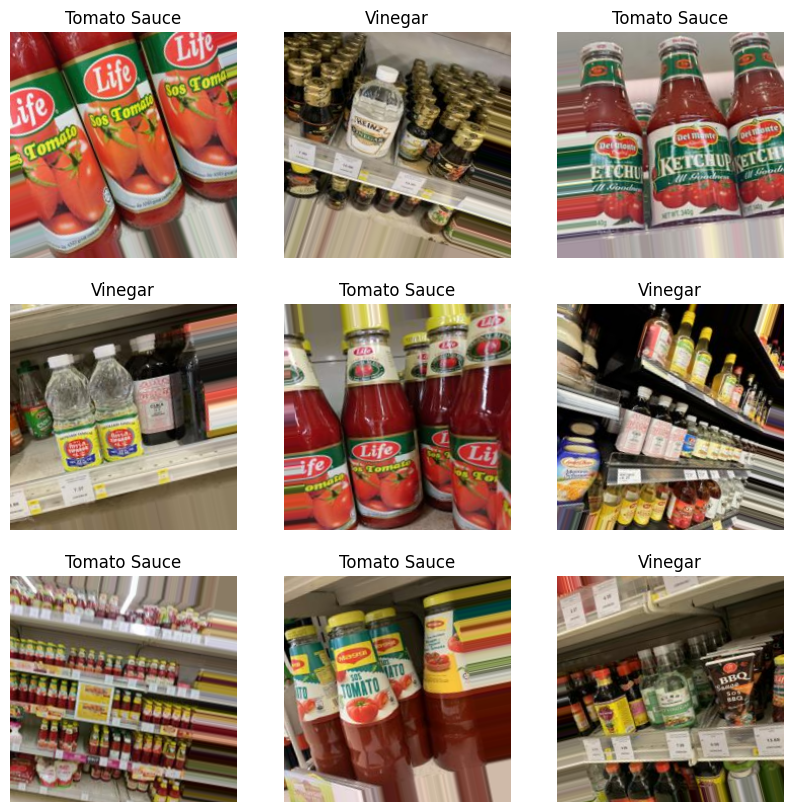

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0] #'0' for image
batch_labels = single_train_image_batch[1] #'1' for label
print(batch_images.shape) #o/p=50, 224, 224, 3;
print(batch_labels.shape) # o/p=50;

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

Step 7: Create the base model from the pre-trained VGG16

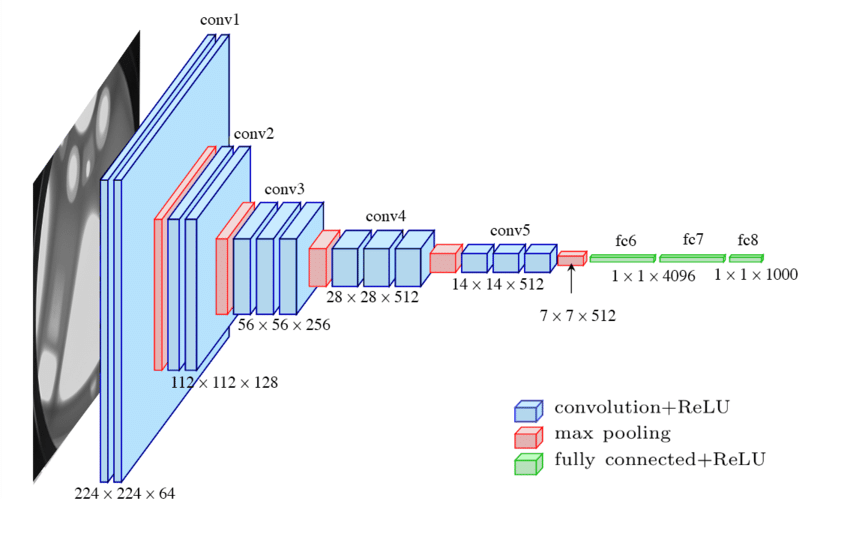

Instantiate a VGG16 model pre-loaded with weights trained on ImageNet.

In [ ]:
# Creating  base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

print("****VGG16 original network arhitecture****")
base_model.summary()

****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxP

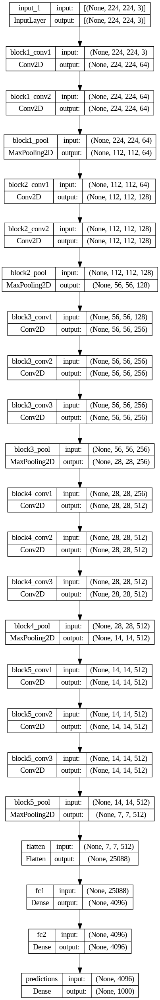

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

# Results

### Train model **without** image/data augmentation and unfreeze last layer

Step 1: Recreate model from VGG16

In [ ]:
model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                             

Step 2: Freeze the existing weights & add the last layer with new dense layer

In [ ]:
# Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

# Add the last layer with new dense layer with 2 outputs replacing the dense layer with 1000 outputs
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

Step 3: Compile the model

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Step 4: Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

Epoch 1/5
16/16 [==============================] - 557s 35s/step - loss: 0.4827 - accuracy: 0.7989 - val_loss: 0.6155 - val_accuracy: 0.7778
Epoch 2/5
16/16 [==============================] - 570s 36s/step - loss: 0.1592 - accuracy: 0.9396 - val_loss: 0.7091 - val_accuracy: 0.7884
Epoch 3/5
16/16 [==============================] - 534s 34s/step - loss: 0.1212 - accuracy: 0.9527 - val_loss: 0.6835 - val_accuracy: 0.7831
Epoch 4/5
16/16 [==============================] - 532s 34s/step - loss: 0.0630 - accuracy: 0.9777 - val_loss: 0.7251 - val_accuracy: 0.7725
Epoch 5/5
16/16 [==============================] - 526s 35s/step - loss: 0.0613 - accuracy: 0.9777 - val_loss: 0.8711 - val_accuracy: 0.7778


Step 5: Learning curves plotting

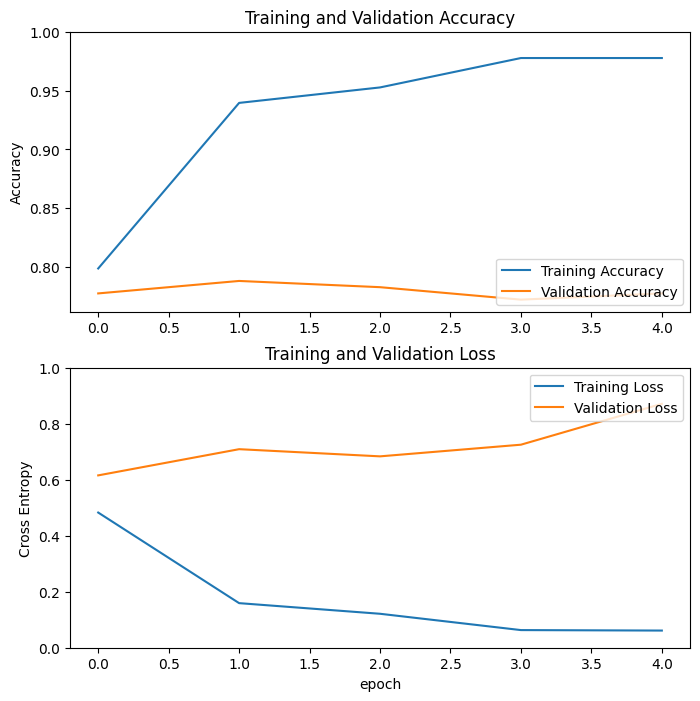

In [ ]:
#plot learning curve
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Step 6: Model testing

9/9 [==============================] - 221s 24s/step - loss: 0.2354 - accuracy: 0.9291
Test accuracy: 0.9290953278541565


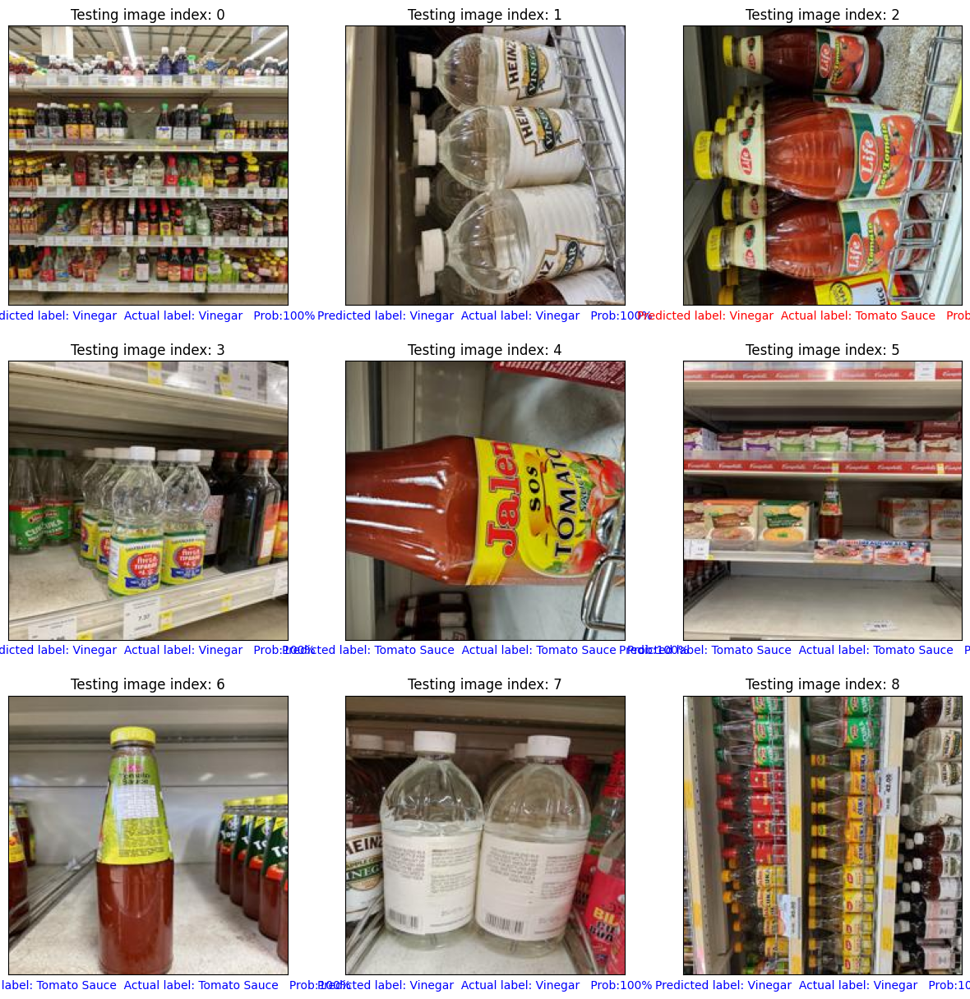

In [ ]:
#test the model
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)


# test model in test image
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

### Train model **with** image/data augmentation and unfreeze last layer

Step 1: Create an instance of ImageDataGenerator with augmentation options

In [ ]:
train_data_generator = ImageDataGenerator( validation_split=0.2,
                                          rotation_range = 20,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          )

Step 2:  Create the train batch generator

In [ ]:
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 761 images belonging to 2 classes.


Step 3: Visualize augmented image

(50, 224, 224, 3)
(50,)


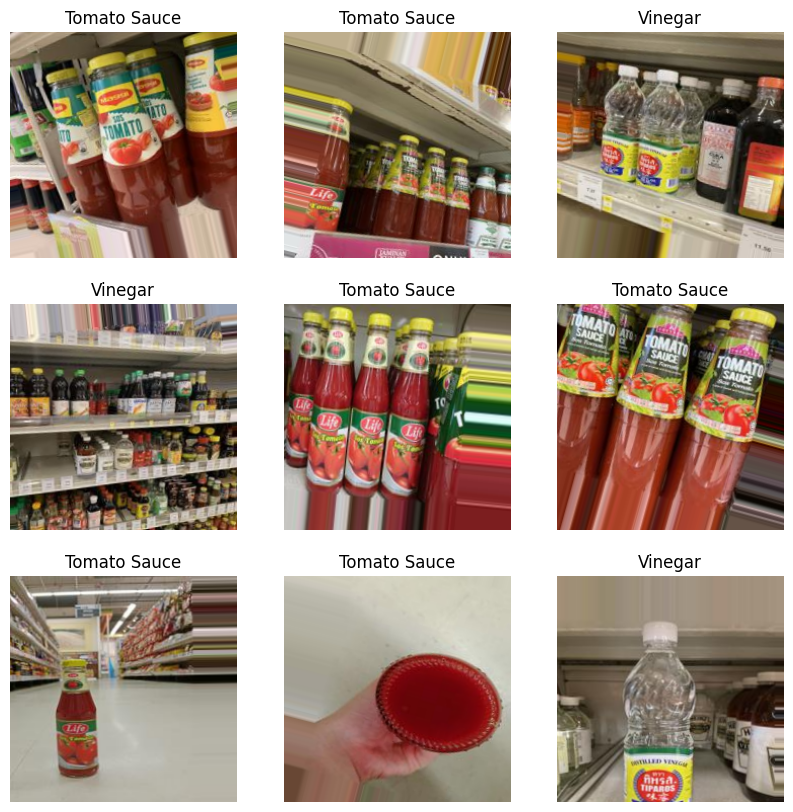

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

Step 4: Recreate the model from VGG16

In [ ]:
model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

Step 5: Freeze layers and add last layer with dense layer

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

Step 6: Compile the model

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Step 7: Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
16/16 [==============================] - 530s 33s/step - loss: 0.4273 - accuracy: 0.8187 - val_loss: 0.6138 - val_accuracy: 0.7566
Epoch 2/3
16/16 [==============================] - 523s 33s/step - loss: 0.1388 - accuracy: 0.9409 - val_loss: 0.5527 - val_accuracy: 0.8042
Epoch 3/3
16/16 [==============================] - 524s 33s/step - loss: 0.0834 - accuracy: 0.9724 - val_loss: 0.6755 - val_accuracy: 0.7831


Step 8: Plot the Learning Curves

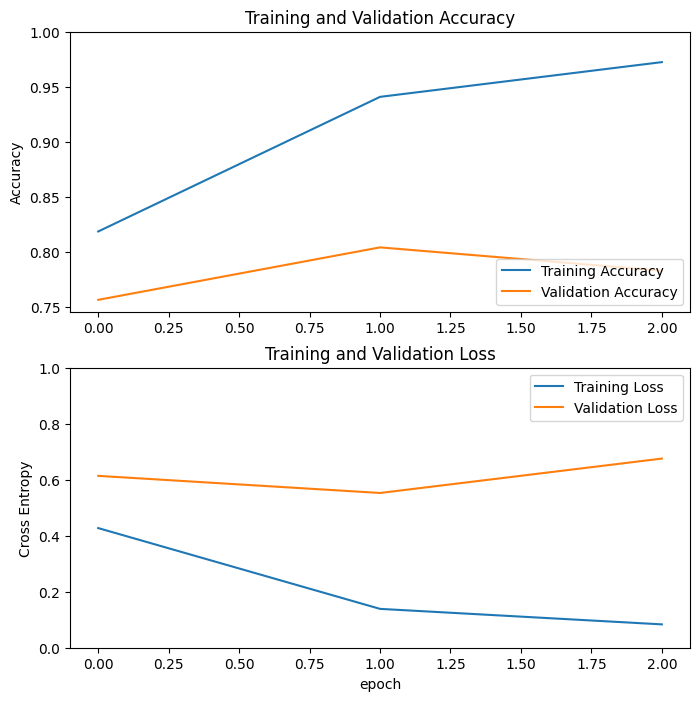

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Step 9: Test the model

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

9/9 [==============================] - 224s 25s/step - loss: 0.2300 - accuracy: 0.9267
Test accuracy: 0.92665034532547


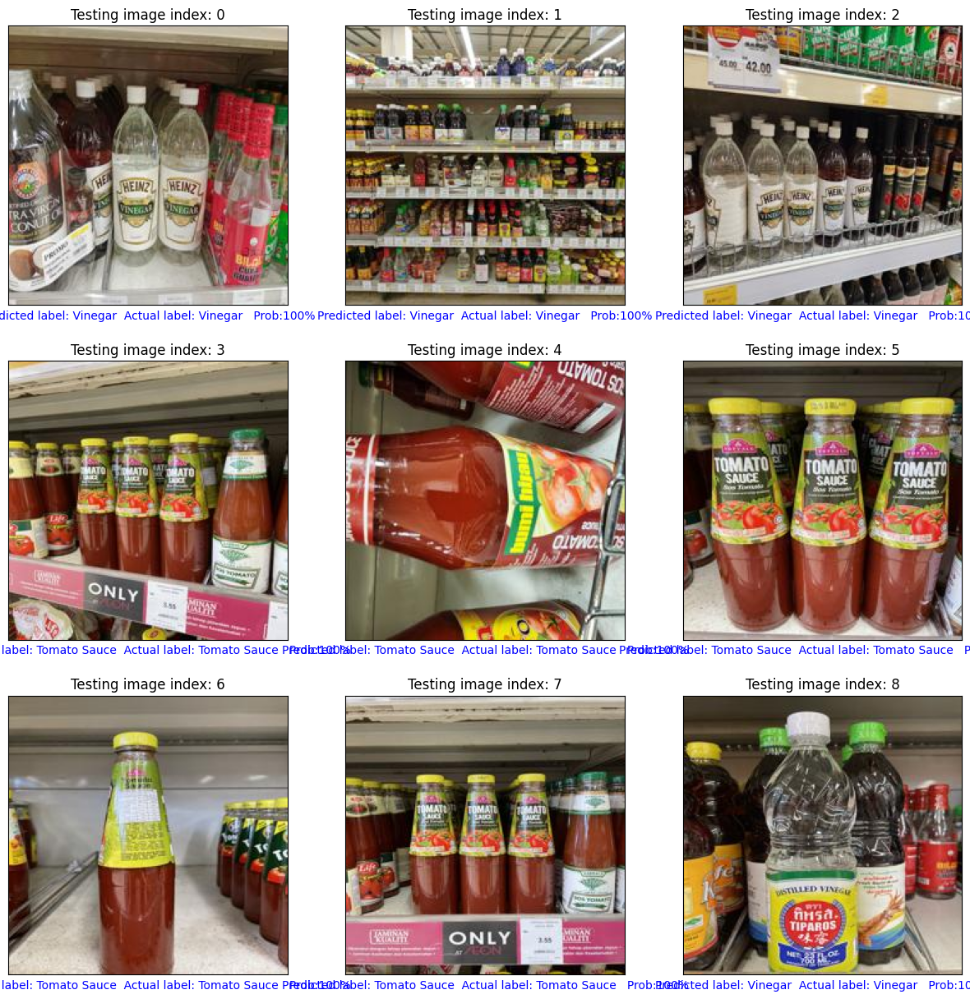

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))


### Train model without image/data augmentation and and unfreeze last and 2nd layer

Step 1: Load pre-trained VGG16 model

In [ ]:
# Import necessary libraries
import tensorflow as tf
import matplotlib.pyplot as plt

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

print("****VGG16 original network architecture****")
base_model.summary()

****VGG16 original network architecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (Max

Step 2: Create a new model without the last two layers

In [ ]:
# Create our model by copying from the 1st layer to the 2nd last layer
model = tf.keras.models.Sequential()
for layer in base_model.layers[:-2]:
    model.add(layer)

print("****Model after removing the last two layers from VGG16****")
model.summary()

****Model after removing the last two layers from VGG16****
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                            

Step 3: Freeze layers and add last two layers with dense layers

In [ ]:
# Freezing the existing weights except the last two layers
for layer in model.layers[:-2]:
    layer.trainable = False

print(model.summary())

# Add new dense layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****Model after adding new dense layer****")
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

Step 4: Compile the model

In [ ]:
# Compile the model
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Step 5: Train the model

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
16/16 [==============================] - 559s 35s/step - loss: 64.0756 - accuracy: 0.7792 - val_loss: 37.1145 - val_accuracy: 0.7407
Epoch 2/3
16/16 [==============================] - 580s 38s/step - loss: 2.5909 - accuracy: 0.9606 - val_loss: 34.2138 - val_accuracy: 0.7302
Epoch 3/3
16/16 [==============================] - 609s 38s/step - loss: 2.2594 - accuracy: 0.9698 - val_loss: 27.4853 - val_accuracy: 0.7725


Step 6: Plot the learning curves

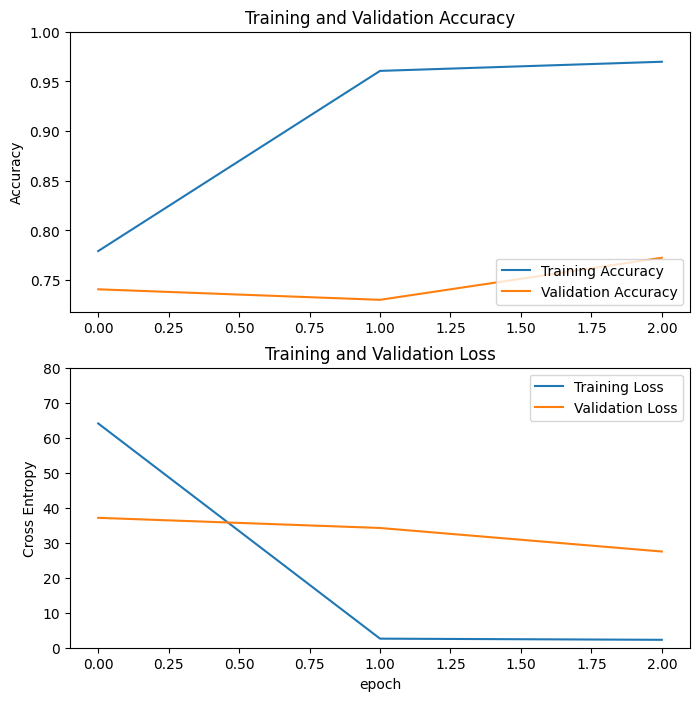

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,80.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Step 7: Test the model

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

9/9 [==============================] - 225s 24s/step - loss: 7.3799 - accuracy: 0.9267
Test accuracy: 0.92665034532547


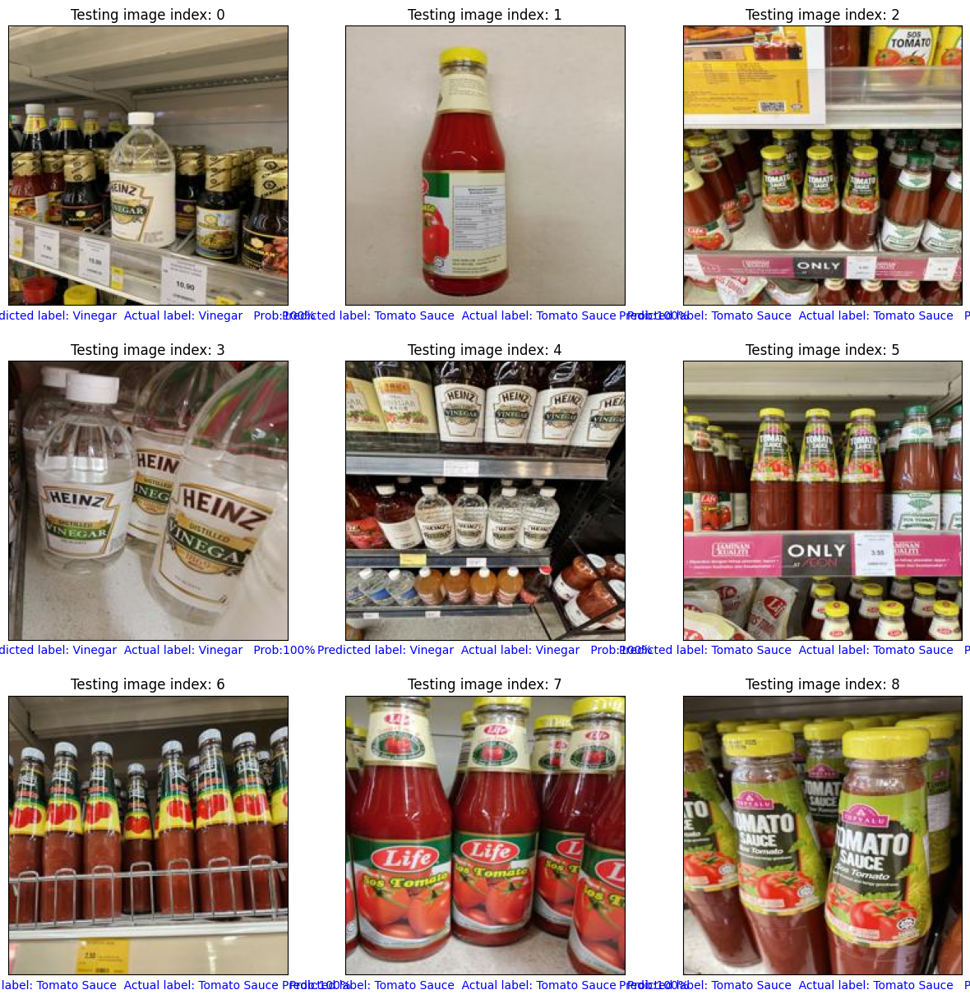

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## Chapter 3: Discussion



* **With Data Augmentation and Unfreezing Last Layer:**
    * The model shows great training improvement in accuracy (0.9724) and loss (0.0834) across the epochs. The data augmentation provides diverse set of training examples that improves the model's ability to generalize the predictions.     
    * During the validation, the accuracy improved in the first two epochs but decreased in third showing signs of overfitting.
    * When tested, the accuracy showed 92.67% showing good generalization as the low test loss of 0.2300 showed that the model prediction are confident and consistent throughout predicting.

* **Without Data Augmentation, Unfreeze Last Layer:**
    * During training, the model trainig accuracy increased (0.9527)  showing that the model learns from the training data well, with training loss (0.1212) that is slightly higher than when the data is augmented at the third epoch.
    * When validated, the validation accuracy showed slight improvement but was inconsistent and decreased in some epochs showing signs of overfitting, hence later the validation loss increased in the later epochs.
    * However, even when overfitted the model still showed high test accuracy of 92.91% and test loss of 0.2354.

* **Without Data Augmentation and Unfreezing Last Two Layers:**
    * During training, the loss was very high at 64.0756 , but the model adapted quickly in the consecutive epochs . This indicates that the model had trouble in the initial learning.
    * When the model was validated, the accuracy fluctuated and showed inconsistent improvement but the validation loss remained quite high showing severe overfitting signs.
    * The model had a high test accuracy of 92.67% similiarly to the other models but a high test loss of 7.3799 which shows a low confidence in its predictions as it may due to overfitting.



Data augmentation plays a crucial role in enhancing the performance of CNN models trained on datasets like those containing images of tomato sauce and vinegar bottles. By introducing variability through techniques such as rotations, flips, and zooms, data augmentation helps the model generalize better to new, unseen images. This approach reduces overfitting by preventing the model from memorizing specific details of the training images and instead encourages learning of more robust features that are applicable across different orientations and conditions. The result is higher test accuracy and lower test loss, as the model can effectively handle diverse inputs due to its exposure to augmented training examples.

Unfreezing layers in a pre-trained CNN model, such as VGG16, allows for fine-tuning of weights during training. This process enables the model to adapt its learned representations to better fit the specific characteristics of the tomato sauce and vinegar dataset. By unfreezing more layers, especially deeper layers that capture higher-level features, the model can refine its understanding of complex patterns and object-specific details. This adaptation is crucial for improving classification accuracy, as it tailors the model’s learned features to the nuances present in the dataset. However, the increased flexibility from unfreezing layers also necessitates careful management to avoid overfitting. Regularization techniques like data augmentation help mitigate this risk by providing a broader range of training examples while adjusting model capacity to maintain balance between complexity and generalization.

The dataset’s unique characteristics further enhance the model's ability to distinguish between tomato sauce and vinegar. The distinct color contrast, with tomato sauce typically being red and vinegar often transparent or light-colored, provides clear visual cues that facilitate accurate classification. These color differences allow the model to learn distinguishing features early in training, aiding in robust classification. Additionally, variations in bottle shapes, labels, and textures within the dataset offer additional discriminative elements that contribute to the model's accuracy. The diversity of angles from which the images are captured further enriches the training process, enabling the model to recognize objects from multiple viewpoints. Together, these dataset characteristics, combined with effective training strategies like data augmentation and strategic layer unfreezing, contribute to the CNN model's superior performance in distinguishing between tomato sauce and vinegar.

## Chapter 4: Conclusion

In this study, an automated classification algorithm was successfully developed through the use of the VGG16 model developed through a CNN-based transfer learning approach, that allows the classification of vinegar from tomato sauce. A significant impact was found on model performance by augmentation of data and strategic unfreezing of layers.

Data augmentation proved to be important in enhancing the model's generalization ability, leading to improved accuracy and reduced overfitting. Specifically, the model achieved high training accuracy and low loss with data augmentation, demonstrating better generalization during testing with an accuracy of 92.67%. Conversely, without data augmentation, the model exhibited higher training loss and fluctuating validation accuracy, indicating potential overfitting. Even with these challenges, the model maintained a high test accuracy of 92.91%.

Unfreezing the last layer and training with data augmentation produced the best results, highlighting the balance between model flexibility and overfitting prevention. The dataset's unique characteristics, including distinct color contrasts and diverse image angles, further improved and contributed to the model's high performance.

In summary, this project demonstrates the effectiveness of combining the use of augmented data and strategic layer unfreezing in order to develop a reliable and accurate classification system. Nevertheless, these findings demonstrate the potential of AI and computer vision technologies for the enhancement of daily living for visually impaired individuals, especially in the area of grocery item identification.


References


1.   Mohamed, A., Aziz, S. M., & Eid, H. F. (2022). Deep transfer learning approach for classification of grocery store dataset using data augmentation. NeuroQuantology, 20(13), 265.
2.   Ren, J., & Wang, Y. (2022). Overview of object detection algorithms using convolutional neural networks. Journal of Computer and Communications, 10(1), 115-132.
3.   K. Weiss, T.M. Khoshgoftaar, D.D. Wang, A
survey of transfer learning, J Big Data. 3 (2016)
1–40. https://doi.org/10.1186/S40537-016-0043-6/TABLES/6.
4.   M. Shamim Hossain, M. Al-Hammadi, G. Muhammad, Automatic Fruit Classification Using Deep Learning for Industrial Applications, IEEE Trans Industr Inform. 15 (2019) 1027–1034. https://doi.org/10.1109/TII.2018.2875149.
5.   A Systematic Review on Product Recognition for Aiding Visually Impaired People | IEEE Latin America Transactions, (n.d.). https://latamt.ieeer9.org/index.php/transaction s/article/view/3760 (accessed April 11, 2022).
6.  Alatawi, A. A., Alomani, S. M., Alhawiti, N. I., & Ayaz, M. (2022). Plant disease detection using AI based VGG-16 model. International Journal of Advanced Computer Science and Applications, 13(4).
